# **Training HRPlane Dataset with YOLOv8x: Experiment No. 12**

<p align="center">
    <img src="https://github.com/RSandAI/Comprehensive-YOLO-Airplane-Detection/blob/main/assets/image.png" height=450 width=1280 alt=""/>
</p>

<small>Picture Source: <a href="https://github.com/RSandAI/Comprehensive-YOLO-Airplane-Detection/">RSandAI, Comprehensive YOLO Airplane Detection</a></small>

<br>

## **Context**

The HRPlanes dataset is a valuable resource in the domain of computer vision, particularly for tasks related to object detection, specifically focusing on aircraft within Very High Resolution (VHR) Google Earth images. This dataset comprises 3101 RGB images of major airports and aircraft boneyards, manually annotated with bounding boxes for airplanes using Plainsight (formerly HyperLabel). Quality control was conducted independently, resulting in 18,477 annotated airplanes. The dataset is split into 70% training (2170 images), 20% validation (620 images), and 10% testing (311 images) sets.

<br>

To facilitate accurate training and evaluation, each aircraft within the images has been meticulously labeled, resulting in a comprehensive annotation set covering a total of 18,477 aircraft instances. These annotations provide bounding box coordinates for each detected aircraft within the corresponding images.

<br>

Given the specifics of the HRPlanes dataset and its annotations, training object detection models like YOLOv8 would involve leveraging this rich dataset to teach the model to accurately detect and localize aircraft within VHR Google Earth images. This process would entail feeding the dataset into the YOLOv8 model architecture and iteratively training the model until satisfactory performance metrics are achieved. Access to the HRPlanes dataset provides researchers, practitioners, and developers with a valuable asset for advancing the state-of-the-art in aircraft detection algorithms, with potential applications spanning aviation security, urban planning, and defense intelligence. The dataset's availability ensures its accessibility to the wider computer vision community, fostering collaboration and innovation in this domain.

**Hyperparameters:**

| Epochs | Network size | Batch size | LR | Optimizer | Hue | Saturation | Value | Mosiac |
|--|--|--|--|--|--|--|--|--|
| 100 | 960x960 | 16 | 0.001 | SGD | 0.015 | 0.7 | 0.4 | 1.0 |

<br>

Make sure your runtime is **GPU** (_not_ CPU or TPU). And if it is an option, make sure you are using _Python 3_. You can select these settings by going to `Runtime -> Change runtime type -> Select the above mentioned settings and then press SAVE`.

## **0. Initial Steps**

### **0.1 Download Library**

In [ ]:
!pip install ultralytics -q

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 755.0/755.0 kB 5.5 MB/s eta 0:00:00


### **0.2. Import Libraries and Connect Google Drive**

In [ ]:
from google.colab import drive
drive.mount('/gdrive')

Mounted at /gdrive


In [ ]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import pandas as pd
import numpy as np
import json
import shutil
import seaborn as sns
import os
from ultralytics import YOLO

### **0.3. Define Paths and Hyperparameters**

In [ ]:
# @markdown ---

BASE_DIRECTORY = '/gdrive/MyDrive/Datasets/HRPlanes/YOLOV8/YOLOv8x/Experiment_No_12/' # @param {type:"string"}
if os.path.exists(BASE_DIRECTORY):
    print(f"Base directory already exists: {BASE_DIRECTORY}")
else:
    os.makedirs(BASE_DIRECTORY)
    print(f"Created base directory: {BASE_DIRECTORY}")

SAVE_DIR = BASE_DIRECTORY + 'outputs'
if os.path.exists(SAVE_DIR):
    print(f"Save directory already exists: {SAVE_DIR}")
else:
    os.makedirs(SAVE_DIR)
    print(f"Created save directory: {SAVE_DIR}")

# @markdown ---

IMAGE_SIZE = 960 # @param {type:"integer"}
BATCH = 16 # @param {type:"integer"}
LR = 0.001 # @param {type:"number"}
OPTIMIZER = 'SGD' # @param {type:"string"}

# @markdown ---

HUE = 0.015 # @param {type:"number"}
SATURATION = 0.7 # @param {type:"number"}
VALUE = 0.4 # @param {type:"number"}
MOSIAC = 1.0 # @param {type:"number"}

# @markdown ---

Created base directory: /gdrive/MyDrive/Datasets/HRPlanes/YOLOV8/YOLOv8x/Experiment_No_12/
Created save directory: /gdrive/MyDrive/Datasets/HRPlanes/YOLOV8/YOLOv8x/Experiment_No_12/outputs


## **1. Train the Model**

The A100 GPU is a powerful graphics processing unit (GPU) developed by NVIDIA. It is part of the NVIDIA Ampere architecture and is designed for high-performance computing tasks, including deep learning, data analytics, and scientific computing. The A100 GPU offers significant improvements in performance and efficiency compared to previous GPU models, making it ideal for demanding AI and machine learning applications.

In [ ]:
!nvidia-smi

Mon Apr 29 11:36:24 2024       
+---------------------------------------------------------------------------------------+
| NVIDIA-SMI 535.104.05             Driver Version: 535.104.05   CUDA Version: 12.2     |
|-----------------------------------------+----------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |         Memory-Usage | GPU-Util  Compute M. |
|                                         |                      |               MIG M. |
|=========================================+======================+======================|
|   0  NVIDIA A100-SXM4-40GB          Off | 00000000:00:04.0 Off |                    0 |
| N/A   32C    P0              41W / 400W |      2MiB / 40960MiB |      0%      Default |
|                                         |                      |             Disabled |
+-----------------------------------------+----------------------+--

### **1.1. Train Model**

YOLOv8x refers to a variant of the YOLO (You Only Look Once) object detection model, specifically based on the YOLOv4 architecture. YOLOv4 is a state-of-the-art deep learning model used for real-time object detection tasks. The "x" in YOLOv8x typically denotes an extended or modified version of the original model, possibly with improvements or adjustments.

In [ ]:
model = YOLO('/gdrive/MyDrive/Datasets/HRPlanes_ds/yolov8x.pt')

In [ ]:
%load_ext tensorboard

In [ ]:
results = model.train(data='/gdrive/MyDrive/Datasets/HRPlanes/YOLOV8/coco.yaml', epochs=100, imgsz=IMAGE_SIZE, batch=BATCH, lr0=LR, optimizer=OPTIMIZER, hsv_h=HUE, hsv_s=SATURATION, hsv_v=VALUE, mosaic=MOSIAC)

Ultralytics YOLOv8.2.5 🚀 Python-3.10.12 torch-2.2.1+cu121 CUDA:0 (NVIDIA A100-SXM4-40GB, 40514MiB)
engine/trainer: task=detect, mode=train, model=/gdrive/MyDrive/Datasets/HRPlanes_ds/yolov8x.pt, data=/gdrive/MyDrive/Datasets/HRPlanes/YOLOV8/coco.yaml, epochs=100, time=None, patience=100, batch=16, imgsz=960, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=train, exist_ok=False, pretrained=True, optimizer=SGD, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, 

100%|██████████| 755k/755k [00:00<00:00, 121MB/s]


Overriding model.yaml nc=80 with nc=1

                   from  n    params  module                                       arguments                     
  0                  -1  1      2320  ultralytics.nn.modules.conv.Conv             [3, 80, 3, 2]                 
  1                  -1  1    115520  ultralytics.nn.modules.conv.Conv             [80, 160, 3, 2]               
  2                  -1  3    436800  ultralytics.nn.modules.block.C2f             [160, 160, 3, True]           
  3                  -1  1    461440  ultralytics.nn.modules.conv.Conv             [160, 320, 3, 2]              
  4                  -1  6   3281920  ultralytics.nn.modules.block.C2f             [320, 320, 6, True]           
  5                  -1  1   1844480  ultralytics.nn.modules.conv.Conv             [320, 640, 3, 2]              
  6                  -1  6  13117440  ultralytics.nn.modules.block.C2f             [640, 640, 6, True]           
  7                  -1  1   3687680  ultralytics

100%|██████████| 6.23M/6.23M [00:00<00:00, 254MB/s]


AMP: checks passed ✅


train: Scanning /gdrive/MyDrive/Datasets/HRPlanes_ds/train/labels.cache... 2170 images, 4 backgrounds, 0 corrupt: 100%|██████████| 2170/2170 [00:00<?, ?it/s]


albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))


/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
val: Scanning /gdrive/MyDrive/Datasets/HRPlanes_ds/val/labels.cache... 620 images, 5 backgrounds, 0 corrupt: 100%|██████████| 620/620 [00:00<?, ?it/s]


Plotting labels to runs/detect/train/labels.jpg... 
optimizer: SGD(lr=0.001, momentum=0.937) with parameter groups 97 weight(decay=0.0), 104 weight(decay=0.0005), 103 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 960 train, 960 val
Using 8 dataloader workers
Logging results to runs/detect/train
Starting training for 100 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      1/100      27.2G      1.104       1.48      1.174         72        960: 100%|██████████| 136/136 [06:18<00:00,  2.78s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:09<00:00,  2.09it/s]


                   all        620       3290      0.969      0.956       0.98       0.77

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      2/100      27.5G     0.7993     0.4591      1.022        173        960: 100%|██████████| 136/136 [02:02<00:00,  1.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:06<00:00,  3.13it/s]


                   all        620       3290       0.98       0.97      0.991      0.811

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      3/100      27.6G     0.7278     0.3863      0.977         99        960: 100%|██████████| 136/136 [02:00<00:00,  1.13it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:06<00:00,  3.06it/s]


                   all        620       3290      0.978      0.982      0.992      0.833

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      4/100      27.6G     0.6956     0.3436     0.9598        115        960: 100%|██████████| 136/136 [01:57<00:00,  1.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:06<00:00,  3.10it/s]


                   all        620       3290       0.98      0.981      0.992      0.843

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      5/100      27.2G     0.6653     0.3244     0.9553         89        960: 100%|██████████| 136/136 [02:10<00:00,  1.04it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:06<00:00,  3.02it/s]

                   all        620       3290      0.981      0.986      0.993      0.854



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      6/100        27G     0.6376     0.3044     0.9395        100        960: 100%|██████████| 136/136 [02:00<00:00,  1.13it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:06<00:00,  3.20it/s]


                   all        620       3290      0.985       0.99      0.993      0.864

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      7/100      27.5G     0.6233     0.2968     0.9352         90        960: 100%|██████████| 136/136 [02:04<00:00,  1.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:06<00:00,  3.04it/s]

                   all        620       3290      0.985      0.991      0.993      0.867



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      8/100      27.2G     0.6042     0.2887     0.9198        111        960: 100%|██████████| 136/136 [01:58<00:00,  1.15it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:06<00:00,  3.16it/s]

                   all        620       3290      0.988       0.99      0.993      0.863



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      9/100      27.2G      0.594     0.2791     0.9223        121        960: 100%|██████████| 136/136 [02:19<00:00,  1.03s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:06<00:00,  2.90it/s]

                   all        620       3290      0.987      0.988      0.993       0.87



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     10/100      27.5G     0.5836     0.2745     0.9116        103        960: 100%|██████████| 136/136 [02:21<00:00,  1.04s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:06<00:00,  2.88it/s]

                   all        620       3290      0.986      0.989      0.993      0.873



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     11/100      27.5G     0.5817     0.2738     0.9072         67        960: 100%|██████████| 136/136 [02:05<00:00,  1.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:06<00:00,  2.89it/s]


                   all        620       3290      0.987      0.991      0.993      0.878

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     12/100      27.6G     0.5724     0.2648     0.9082         75        960: 100%|██████████| 136/136 [02:05<00:00,  1.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:05<00:00,  3.39it/s]

                   all        620       3290      0.988      0.993      0.993      0.873



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     13/100      27.6G     0.5629     0.2644     0.9041         87        960: 100%|██████████| 136/136 [02:15<00:00,  1.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:06<00:00,  2.93it/s]

                   all        620       3290      0.986      0.993      0.993      0.887



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     14/100      27.5G     0.5635     0.2647      0.892        103        960: 100%|██████████| 136/136 [02:17<00:00,  1.01s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:05<00:00,  3.35it/s]

                   all        620       3290      0.986      0.993      0.993      0.881



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     15/100      27.1G     0.5544     0.2563     0.8888         99        960: 100%|██████████| 136/136 [02:16<00:00,  1.00s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:06<00:00,  3.09it/s]

                   all        620       3290      0.985      0.991      0.993      0.881



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     16/100      27.3G     0.5485       0.26     0.8992         96        960: 100%|██████████| 136/136 [01:58<00:00,  1.15it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:06<00:00,  3.15it/s]

                   all        620       3290      0.989      0.989      0.993      0.879



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     17/100      27.5G     0.5437     0.2575     0.8918        128        960: 100%|██████████| 136/136 [02:05<00:00,  1.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:05<00:00,  3.35it/s]

                   all        620       3290      0.988      0.993      0.993      0.887



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     18/100      26.9G     0.5367     0.2488     0.8895         89        960: 100%|██████████| 136/136 [02:08<00:00,  1.06it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:06<00:00,  2.87it/s]


                   all        620       3290      0.987      0.993      0.993      0.884

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     19/100      27.3G     0.5326      0.246     0.8911        116        960: 100%|██████████| 136/136 [02:08<00:00,  1.06it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:06<00:00,  3.08it/s]

                   all        620       3290      0.989      0.993      0.993      0.887



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     20/100      27.3G     0.5278      0.244     0.8792        207        960: 100%|██████████| 136/136 [02:01<00:00,  1.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:06<00:00,  3.26it/s]

                   all        620       3290      0.991      0.993      0.993      0.882



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     21/100      27.3G     0.5238     0.2391     0.8793         85        960: 100%|██████████| 136/136 [01:52<00:00,  1.21it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:06<00:00,  2.91it/s]

                   all        620       3290      0.989      0.995      0.994      0.889



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     22/100      27.2G     0.5185     0.2399     0.8792         93        960: 100%|██████████| 136/136 [01:59<00:00,  1.14it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:06<00:00,  2.93it/s]


                   all        620       3290      0.987      0.997      0.993      0.886

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     23/100      27.6G      0.522     0.2383     0.8787         67        960: 100%|██████████| 136/136 [01:57<00:00,  1.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:05<00:00,  3.35it/s]

                   all        620       3290      0.989      0.994      0.993      0.887



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     24/100      27.5G     0.5172     0.2366     0.8687        182        960: 100%|██████████| 136/136 [02:12<00:00,  1.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:07<00:00,  2.80it/s]

                   all        620       3290      0.988      0.993      0.993      0.885



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     25/100        27G     0.5076     0.2341     0.8647        102        960: 100%|██████████| 136/136 [02:07<00:00,  1.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:06<00:00,  3.08it/s]


                   all        620       3290       0.99      0.993      0.993      0.891

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     26/100      27.3G     0.5152     0.2343      0.871        136        960: 100%|██████████| 136/136 [02:20<00:00,  1.03s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:06<00:00,  3.21it/s]

                   all        620       3290       0.99      0.991      0.993      0.884



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     27/100      26.9G     0.5108     0.2363     0.8707        101        960: 100%|██████████| 136/136 [02:06<00:00,  1.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:06<00:00,  3.22it/s]

                   all        620       3290      0.987      0.995      0.993      0.886



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     28/100      27.2G      0.508     0.2369     0.8745        149        960: 100%|██████████| 136/136 [02:02<00:00,  1.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:06<00:00,  3.22it/s]

                   all        620       3290      0.986      0.995      0.994      0.891



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     29/100      27.7G     0.5032     0.2339     0.8735        117        960: 100%|██████████| 136/136 [01:54<00:00,  1.18it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:06<00:00,  3.15it/s]


                   all        620       3290      0.986      0.994      0.993      0.888

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     30/100      27.6G     0.4909     0.2304     0.8694         77        960: 100%|██████████| 136/136 [01:57<00:00,  1.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:06<00:00,  2.93it/s]

                   all        620       3290       0.99      0.993      0.993      0.887



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     31/100      27.3G     0.4957     0.2277     0.8653        120        960: 100%|██████████| 136/136 [01:53<00:00,  1.20it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:06<00:00,  3.13it/s]

                   all        620       3290      0.989      0.993      0.993      0.888



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     32/100      27.1G     0.4991     0.2284     0.8633         96        960: 100%|██████████| 136/136 [02:59<00:00,  1.32s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:05<00:00,  3.45it/s]

                   all        620       3290      0.988      0.993      0.993      0.889



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     33/100      27.2G      0.484     0.2222     0.8561        104        960: 100%|██████████| 136/136 [02:05<00:00,  1.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:06<00:00,  2.94it/s]


                   all        620       3290      0.989      0.993      0.993      0.886

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     34/100      27.1G     0.4882     0.2218     0.8569         72        960: 100%|██████████| 136/136 [01:54<00:00,  1.19it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:06<00:00,  3.06it/s]

                   all        620       3290      0.986      0.994      0.994       0.89



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     35/100      27.6G      0.484     0.2197     0.8557        121        960: 100%|██████████| 136/136 [01:51<00:00,  1.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:06<00:00,  2.96it/s]

                   all        620       3290      0.989      0.993      0.993       0.89



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     36/100      27.6G     0.4804     0.2186     0.8611         98        960: 100%|██████████| 136/136 [02:03<00:00,  1.10it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:06<00:00,  3.18it/s]

                   all        620       3290      0.988      0.993      0.994      0.893



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     37/100      27.7G       0.47     0.2166     0.8591        209        960: 100%|██████████| 136/136 [01:56<00:00,  1.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:06<00:00,  2.96it/s]


                   all        620       3290      0.991      0.992      0.994      0.892

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     38/100      27.2G     0.4745     0.2166     0.8576        135        960: 100%|██████████| 136/136 [02:11<00:00,  1.04it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:06<00:00,  2.99it/s]

                   all        620       3290       0.99      0.992      0.994      0.892



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     39/100      27.3G     0.4682     0.2185     0.8577         85        960: 100%|██████████| 136/136 [01:55<00:00,  1.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:06<00:00,  3.01it/s]

                   all        620       3290      0.989      0.993      0.994      0.889



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     40/100      27.3G     0.4635     0.2136     0.8585        122        960: 100%|██████████| 136/136 [01:58<00:00,  1.15it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:06<00:00,  3.14it/s]

                   all        620       3290      0.986      0.996      0.993      0.889



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     41/100      27.6G     0.4703     0.2183     0.8628         77        960: 100%|██████████| 136/136 [02:32<00:00,  1.12s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:06<00:00,  3.28it/s]

                   all        620       3290       0.99      0.994      0.994      0.892



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     42/100      27.2G     0.4627     0.2145     0.8647         85        960: 100%|██████████| 136/136 [01:57<00:00,  1.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:07<00:00,  2.85it/s]

                   all        620       3290      0.991      0.993      0.994       0.89



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     43/100      27.5G     0.4608      0.212     0.8611         82        960: 100%|██████████| 136/136 [02:01<00:00,  1.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:06<00:00,  3.03it/s]

                   all        620       3290      0.988      0.995      0.994       0.89



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     44/100      27.6G     0.4551     0.2107     0.8623         96        960: 100%|██████████| 136/136 [02:10<00:00,  1.04it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:07<00:00,  2.83it/s]

                   all        620       3290      0.989      0.992      0.994      0.887



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     45/100      27.2G     0.4522     0.2065     0.8571         71        960: 100%|██████████| 136/136 [02:09<00:00,  1.05it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:06<00:00,  3.22it/s]

                   all        620       3290      0.991      0.992      0.994      0.889



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     46/100      27.2G     0.4473     0.2079     0.8536        238        960: 100%|██████████| 136/136 [01:54<00:00,  1.19it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:06<00:00,  3.06it/s]


                   all        620       3290      0.989      0.993      0.994      0.892

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     47/100      27.5G     0.4519     0.2078     0.8507        113        960: 100%|██████████| 136/136 [01:54<00:00,  1.19it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:06<00:00,  3.01it/s]


                   all        620       3290       0.99      0.995      0.994      0.893

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     48/100      27.3G     0.4518     0.2098     0.8504         86        960: 100%|██████████| 136/136 [01:55<00:00,  1.18it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:07<00:00,  2.83it/s]

                   all        620       3290      0.988      0.994      0.994      0.897



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     49/100      27.2G     0.4468      0.207     0.8505         72        960: 100%|██████████| 136/136 [01:58<00:00,  1.15it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:06<00:00,  3.25it/s]

                   all        620       3290       0.99      0.992      0.994      0.891



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     50/100      27.7G      0.447     0.2055     0.8488         66        960: 100%|██████████| 136/136 [01:55<00:00,  1.18it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:05<00:00,  3.36it/s]


                   all        620       3290      0.985      0.995      0.994      0.892

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     51/100      27.5G     0.4428     0.2036     0.8451         98        960: 100%|██████████| 136/136 [01:56<00:00,  1.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:06<00:00,  3.01it/s]


                   all        620       3290      0.987      0.995      0.994      0.894

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     52/100      27.7G     0.4383     0.1995     0.8491        109        960: 100%|██████████| 136/136 [01:59<00:00,  1.13it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:06<00:00,  3.06it/s]

                   all        620       3290      0.988      0.992      0.994      0.892



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     53/100      27.1G     0.4348     0.1997     0.8475         94        960: 100%|██████████| 136/136 [01:57<00:00,  1.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:06<00:00,  2.86it/s]

                   all        620       3290      0.987      0.995      0.993      0.891



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     54/100      27.6G     0.4382     0.2017     0.8475         57        960: 100%|██████████| 136/136 [02:07<00:00,  1.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:06<00:00,  3.17it/s]


                   all        620       3290      0.989      0.995      0.993      0.894

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     55/100      27.3G     0.4305     0.1991     0.8472        163        960: 100%|██████████| 136/136 [01:58<00:00,  1.15it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:06<00:00,  3.01it/s]

                   all        620       3290      0.985      0.996      0.993      0.891



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     56/100      26.8G     0.4308     0.1989     0.8456         89        960: 100%|██████████| 136/136 [01:51<00:00,  1.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:06<00:00,  2.98it/s]


                   all        620       3290      0.989      0.994      0.993      0.892

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     57/100      27.7G      0.423     0.1957     0.8423        129        960: 100%|██████████| 136/136 [01:56<00:00,  1.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:06<00:00,  3.21it/s]


                   all        620       3290      0.991      0.993      0.993       0.89

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     58/100      27.5G     0.4324     0.2002     0.8423        141        960: 100%|██████████| 136/136 [02:19<00:00,  1.03s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:06<00:00,  2.99it/s]

                   all        620       3290       0.99      0.992      0.994      0.891



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     59/100      27.2G     0.4269     0.1991     0.8439        118        960: 100%|██████████| 136/136 [02:08<00:00,  1.06it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:06<00:00,  2.96it/s]


                   all        620       3290       0.99      0.994      0.993      0.892

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     60/100      27.6G     0.4175      0.192     0.8378         82        960: 100%|██████████| 136/136 [01:51<00:00,  1.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:06<00:00,  3.01it/s]


                   all        620       3290       0.99      0.994      0.994      0.892

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     61/100      27.6G     0.4237     0.1955     0.8439         56        960: 100%|██████████| 136/136 [02:04<00:00,  1.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:06<00:00,  3.28it/s]


                   all        620       3290      0.989      0.996      0.994      0.891

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     62/100      27.1G     0.4144     0.1908      0.844         67        960: 100%|██████████| 136/136 [01:58<00:00,  1.15it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:06<00:00,  3.24it/s]


                   all        620       3290       0.99      0.995      0.994       0.89

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     63/100      27.7G     0.4201     0.1947     0.8437        142        960: 100%|██████████| 136/136 [01:55<00:00,  1.18it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:07<00:00,  2.82it/s]

                   all        620       3290      0.992      0.994      0.994      0.892



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     64/100      27.6G     0.4125     0.1907     0.8418        137        960: 100%|██████████| 136/136 [02:07<00:00,  1.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:05<00:00,  3.41it/s]

                   all        620       3290       0.99      0.995      0.994       0.89



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     65/100      27.2G     0.4149     0.1915     0.8419         88        960: 100%|██████████| 136/136 [01:50<00:00,  1.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:07<00:00,  2.85it/s]


                   all        620       3290      0.989      0.993      0.994      0.893

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     66/100      27.3G     0.4124       0.19     0.8449         71        960: 100%|██████████| 136/136 [01:53<00:00,  1.20it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:07<00:00,  2.81it/s]

                   all        620       3290      0.991      0.994      0.994      0.894



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     67/100      27.6G     0.4114     0.1913     0.8402        131        960: 100%|██████████| 136/136 [02:08<00:00,  1.06it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:05<00:00,  3.37it/s]

                   all        620       3290       0.99      0.995      0.994       0.89



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     68/100      27.5G     0.4073     0.1878     0.8418         72        960: 100%|██████████| 136/136 [01:58<00:00,  1.15it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:06<00:00,  3.14it/s]

                   all        620       3290       0.99      0.993      0.994      0.891



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     69/100      27.7G      0.407     0.1888     0.8412        119        960: 100%|██████████| 136/136 [01:50<00:00,  1.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:06<00:00,  2.90it/s]

                   all        620       3290      0.989      0.994      0.994      0.892



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     70/100      27.7G     0.4059     0.1889     0.8453        110        960: 100%|██████████| 136/136 [02:07<00:00,  1.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:06<00:00,  2.92it/s]

                   all        620       3290      0.989      0.995      0.994      0.892



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     71/100      26.9G     0.4062     0.1908     0.8435        124        960: 100%|██████████| 136/136 [01:59<00:00,  1.14it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:06<00:00,  3.30it/s]

                   all        620       3290      0.989      0.994      0.994       0.89



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     72/100      27.2G     0.4018     0.1866     0.8399        122        960: 100%|██████████| 136/136 [01:57<00:00,  1.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:06<00:00,  3.07it/s]


                   all        620       3290       0.99      0.993      0.994      0.891

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     73/100      27.3G     0.3951      0.182     0.8385         81        960: 100%|██████████| 136/136 [02:23<00:00,  1.06s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:05<00:00,  3.34it/s]

                   all        620       3290      0.989      0.995      0.994      0.893



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     74/100      27.1G     0.3953     0.1856     0.8384         96        960: 100%|██████████| 136/136 [01:54<00:00,  1.18it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:06<00:00,  2.96it/s]

                   all        620       3290       0.99      0.995      0.994      0.891



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     75/100      27.3G     0.3942     0.1836     0.8378        131        960: 100%|██████████| 136/136 [01:59<00:00,  1.14it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:06<00:00,  3.10it/s]

                   all        620       3290      0.989      0.995      0.994      0.893



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     76/100      27.2G     0.4028     0.1875     0.8411         69        960: 100%|██████████| 136/136 [01:52<00:00,  1.21it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:07<00:00,  2.78it/s]

                   all        620       3290      0.989      0.995      0.994      0.893



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     77/100      27.6G     0.3981      0.186     0.8371        237        960: 100%|██████████| 136/136 [01:52<00:00,  1.21it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:06<00:00,  3.10it/s]

                   all        620       3290      0.992      0.994      0.994      0.892



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     78/100      27.6G     0.3828     0.1773     0.8343        133        960: 100%|██████████| 136/136 [01:54<00:00,  1.19it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:06<00:00,  3.14it/s]

                   all        620       3290      0.991      0.994      0.994      0.893



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     79/100      27.3G     0.3917      0.183     0.8347         77        960: 100%|██████████| 136/136 [01:56<00:00,  1.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:06<00:00,  2.97it/s]

                   all        620       3290      0.991      0.996      0.994      0.894



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     80/100      27.7G     0.3906     0.1808     0.8341        116        960: 100%|██████████| 136/136 [01:59<00:00,  1.14it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:06<00:00,  3.18it/s]

                   all        620       3290      0.991      0.995      0.994      0.893



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     81/100      27.1G     0.3869     0.1796     0.8299         87        960: 100%|██████████| 136/136 [02:07<00:00,  1.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:06<00:00,  3.23it/s]

                   all        620       3290      0.991      0.995      0.994      0.892



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     82/100      27.4G     0.3852     0.1811     0.8276        157        960: 100%|██████████| 136/136 [02:26<00:00,  1.08s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:06<00:00,  3.13it/s]

                   all        620       3290       0.99      0.995      0.994      0.893



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     83/100      27.5G     0.3786     0.1749     0.8278        118        960: 100%|██████████| 136/136 [01:59<00:00,  1.14it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:06<00:00,  2.90it/s]


                   all        620       3290      0.991      0.994      0.994      0.893

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     84/100      27.6G     0.3805     0.1775     0.8278         89        960: 100%|██████████| 136/136 [01:59<00:00,  1.14it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:06<00:00,  2.97it/s]

                   all        620       3290      0.991      0.993      0.994      0.892



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     85/100      27.6G     0.3844     0.1772     0.8307         86        960: 100%|██████████| 136/136 [01:56<00:00,  1.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:05<00:00,  3.47it/s]

                   all        620       3290      0.992      0.994      0.994      0.893



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     86/100      27.3G     0.3775     0.1749     0.8245         88        960: 100%|██████████| 136/136 [02:03<00:00,  1.10it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:06<00:00,  2.93it/s]


                   all        620       3290       0.99      0.993      0.994      0.895

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     87/100      26.9G     0.3792     0.1758     0.8286        101        960: 100%|██████████| 136/136 [02:11<00:00,  1.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:06<00:00,  3.23it/s]

                   all        620       3290       0.99      0.993      0.994      0.893



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     88/100      27.3G     0.3813     0.1768     0.8301         88        960: 100%|██████████| 136/136 [01:54<00:00,  1.19it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:06<00:00,  2.91it/s]

                   all        620       3290      0.991      0.994      0.994      0.893



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     89/100      27.5G     0.3783     0.1738     0.8298        120        960: 100%|██████████| 136/136 [01:55<00:00,  1.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:07<00:00,  2.84it/s]

                   all        620       3290      0.991      0.994      0.994      0.893



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     90/100      27.5G     0.3711     0.1709     0.8269        130        960: 100%|██████████| 136/136 [02:00<00:00,  1.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:06<00:00,  3.19it/s]

                   all        620       3290      0.992      0.995      0.994      0.893


Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))


/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     91/100      27.3G     0.3603     0.1604     0.8179         79        960: 100%|██████████| 136/136 [02:00<00:00,  1.13it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:06<00:00,  3.20it/s]

                   all        620       3290      0.991      0.995      0.994      0.896



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     92/100      27.5G     0.3488     0.1568     0.8112         49        960: 100%|██████████| 136/136 [02:02<00:00,  1.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:06<00:00,  2.89it/s]


                   all        620       3290      0.991      0.994      0.994      0.896

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     93/100      27.3G     0.3433     0.1547      0.809         35        960: 100%|██████████| 136/136 [02:12<00:00,  1.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:06<00:00,  3.30it/s]


                   all        620       3290      0.992      0.995      0.994      0.898

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     94/100      27.3G     0.3433     0.1534     0.8136         45        960: 100%|██████████| 136/136 [01:56<00:00,  1.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:06<00:00,  3.16it/s]

                   all        620       3290      0.992      0.994      0.994      0.897



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     95/100      27.6G      0.339     0.1512     0.8088         91        960: 100%|██████████| 136/136 [02:23<00:00,  1.05s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:06<00:00,  2.87it/s]


                   all        620       3290      0.992      0.994      0.994      0.897

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     96/100      27.6G     0.3361      0.151     0.8104         37        960: 100%|██████████| 136/136 [02:03<00:00,  1.10it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:06<00:00,  3.06it/s]


                   all        620       3290      0.992      0.995      0.994      0.897

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     97/100      27.6G     0.3356     0.1505     0.8097         66        960: 100%|██████████| 136/136 [01:59<00:00,  1.13it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:06<00:00,  3.11it/s]


                   all        620       3290      0.992      0.995      0.994      0.898

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     98/100      27.6G      0.332     0.1495     0.8083         27        960: 100%|██████████| 136/136 [01:56<00:00,  1.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:07<00:00,  2.76it/s]

                   all        620       3290      0.991      0.995      0.994      0.898



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     99/100      27.3G     0.3318     0.1476     0.8121         61        960: 100%|██████████| 136/136 [02:16<00:00,  1.01s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:06<00:00,  2.96it/s]


                   all        620       3290      0.992      0.995      0.994      0.898

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    100/100      27.2G     0.3332     0.1493     0.8085         71        960: 100%|██████████| 136/136 [01:59<00:00,  1.14it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:06<00:00,  2.96it/s]

                   all        620       3290      0.992      0.995      0.994      0.897



100 epochs completed in 3.757 hours.
Optimizer stripped from runs/detect/train/weights/last.pt, 136.7MB
Optimizer stripped from runs/detect/train/weights/best.pt, 136.7MB

Validating runs/detect/train/weights/best.pt...
Ultralytics YOLOv8.2.5 🚀 Python-3.10.12 torch-2.2.1+cu121 CUDA:0 (NVIDIA A100-SXM4-40GB, 40514MiB)
Model summary (fused): 268 layers, 68124531 parameters, 0 gradients, 257.4 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:16<00:00,  1.19it/s]


                   all        620       3290      0.992      0.995      0.994      0.898
Speed: 0.2ms preprocess, 7.4ms inference, 0.0ms loss, 4.5ms postprocess per image
Results saved to runs/detect/train


### **1.2. Monitor Training with TensorBoard**


TensorBoard is a powerful visualization tool designed for TensorFlow, a popular open-source machine learning framework developed by Google. It provides a suite of visualization tools to help you understand, debug, and optimize your TensorFlow programs.

In [ ]:
# %tensorboard --logdir {BASE_DIRECTORY}

In [ ]:
%tensorboard --logdir /content/runs

<IPython.core.display.Javascript object>

## **2. Evaluate Model**

In [ ]:
model = YOLO(f"runs/detect/train/weights/best.pt")
metrics = model.val()

Ultralytics YOLOv8.2.5 🚀 Python-3.10.12 torch-2.2.1+cu121 CUDA:0 (NVIDIA A100-SXM4-40GB, 40514MiB)
Model summary (fused): 268 layers, 68124531 parameters, 0 gradients, 257.4 GFLOPs


val: Scanning /gdrive/MyDrive/Datasets/HRPlanes_ds/val/labels.cache... 620 images, 5 backgrounds, 0 corrupt: 100%|██████████| 620/620 [00:00<?, ?it/s]
/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 39/39 [00:24<00:00,  1.61it/s]


                   all        620       3290      0.992      0.995      0.994      0.899
Speed: 0.2ms preprocess, 9.3ms inference, 0.0ms loss, 7.2ms postprocess per image
Results saved to runs/detect/val


### **2.1 Monitor Box Metrics**

In [ ]:
# @markdown Run this code block to monitor **box** metrics.

attributes = [
    ('metrics.box.map50', 'Mean Average Precision at IoU threshold of 0.5 for all classes.'),
    ('metrics.box.map75', 'Mean Average Precision at IoU threshold of 0.75 for all classes.'),
    ('metrics.box.ap', 'Average Precision at IoU thresholds from 0.5 to 0.95 for all classes.'),
    ('metrics.box.mp', 'Mean Precision of all classes.'),
    ('metrics.box.mr', 'Mean Recall of all classes.'),
    # ('metrics.box.mean_results', 'Mean of results, returns Mean Precision, Mean Recall, Mean Average Precision at IoU threshold of 0.5, Mean Average Precision at IoU threshold of 0.5 to 0.95.'),
    ('metrics.box.p', 'Precision for each class.'),
    ('metrics.box.r', 'Recall for each class.'),
    ('metrics.box.f1', 'F1 score for each class.'),
    ('metrics.box.nc', 'Number of classes.')
]

for attr, explanation in attributes:
    value = getattr(metrics.box, attr.split('.')[-1])
    if isinstance(value, np.ndarray):
        value = np.float64(value[0])
    print(f'{attr}: {value:.4f} - {explanation}')

with open(f"{BASE_DIRECTORY}outputs/attributes.json", "w") as f:
    json.dump(attributes, f)

box_metrics_dict = {}
for attr, explanation in attributes:
    value = getattr(metrics.box, attr.split('.')[-1])
    if isinstance(value, np.ndarray):
        value = np.float64(value[0])
    box_metrics_dict[attr] = {
        "value": value,
        "description": explanation
    }

with open(f"{BASE_DIRECTORY}outputs/box_metrics.json", "w") as f:
    json.dump(box_metrics_dict, f)

metrics.box.map50: 0.9939 - Mean Average Precision at IoU threshold of 0.5 for all classes.
metrics.box.map75: 0.9925 - Mean Average Precision at IoU threshold of 0.75 for all classes.
metrics.box.ap: 0.8990 - Average Precision at IoU thresholds from 0.5 to 0.95 for all classes.
metrics.box.mp: 0.9915 - Mean Precision of all classes.
metrics.box.mr: 0.9950 - Mean Recall of all classes.
metrics.box.p: 0.9915 - Precision for each class.
metrics.box.r: 0.9950 - Recall for each class.
metrics.box.f1: 0.9932 - F1 score for each class.
metrics.box.nc: 1.0000 - Number of classes.


### **2.2 Monitor Best Metrics**

In [ ]:
# @markdown Run this block to monitor **best** metrics.

for key, value in metrics.results_dict.items():
    if key == 'metrics/precision(B)':
        print(f'Precision: {value:.4f} - Percentage of correct positive predictions.')
    elif key == 'metrics/recall(B)':
        print(f'Recall: {value:.4f} - Percentage of actual positives that were correctly predicted.')
    elif key == 'metrics/mAP50(B)':
        print(f'mAP50: {value:.4f} - Mean Average Precision at 50% IOU.')
    elif key == 'metrics/mAP50-95(B)':
        print(f'mAP50-95: {value:.4f} - Mean Average Precision between 50% and 95% IOU.')
    # else:
    #     print(f'{key}: {value:.4f}')

precision = metrics.results_dict['metrics/precision(B)']
recall = metrics.results_dict['metrics/recall(B)']
f1_score = 2 * (precision * recall) / (precision + recall)

print(f'F1 Score: {f1_score:.4f} - Harmonic mean of precision and recall.')

metrics_dict = {}
for key, value in metrics.results_dict.items():
    attribute = next((desc for attr, desc in attributes if attr == key), None)
    metrics_dict[key] = {
        "value": value,
        "description": attribute if attribute is not None else "No description available"
    }

with open(f"{BASE_DIRECTORY}outputs/metrics.json", "w") as f:
    json.dump(metrics_dict, f)

Precision: 0.9915 - Percentage of correct positive predictions.
Recall: 0.9950 - Percentage of actual positives that were correctly predicted.
mAP50: 0.9939 - Mean Average Precision at 50% IOU.
mAP50-95: 0.8990 - Mean Average Precision between 50% and 95% IOU.
F1 Score: 0.9932 - Harmonic mean of precision and recall.


### **2.3. Plot Confusion Matrix and Calculate Overall Accuracy**

In [ ]:
def calculate_accuracy(TP, FN, FP):

    accuracy = (TP) / (TP + FN + FP)

    return accuracy

In [ ]:
cm = metrics.confusion_matrix.matrix

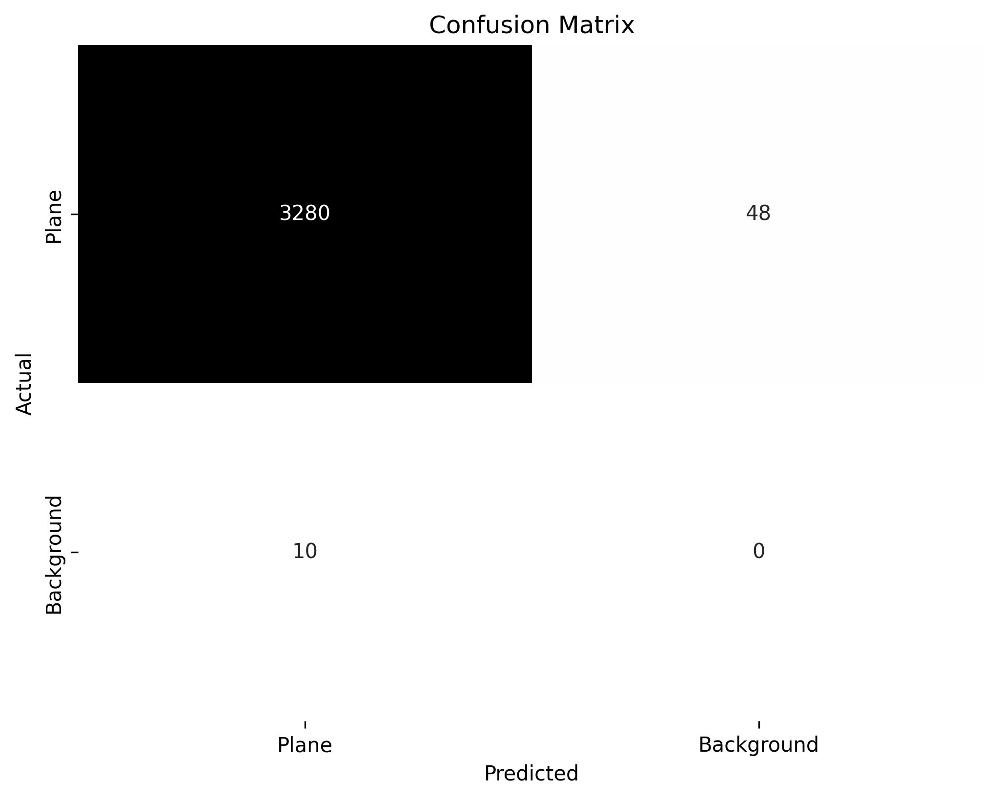

In [ ]:
plt.figure(figsize=(8, 6), dpi=300)
sns.heatmap(cm.astype(int), annot=True, fmt='d', cmap='Greys', cbar=False)
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix')
plt.xticks(ticks=[0.5, 1.5], labels=['Plane', 'Background'])
plt.yticks(ticks=[0.5, 1.5], labels=['Plane', 'Background'])
plt.savefig(f"{BASE_DIRECTORY}/outputs/confusion_matrix_customized.png")
plt.show()

In [ ]:
TP = int(cm[0][0])
FN = int(cm[1][0])
FP = int(cm[0][1])

accuracy = calculate_accuracy(TP, FN, FP)

print("Accuracy:", round(accuracy, 4))

Accuracy: 0.9826


### **2.4. Plot Best Results**

**mAP50 (mean Average Precision at 50)** is a metric commonly used in object detection tasks, including those using YOLO (You Only Look Once) models like YOLOv8x. It calculates the average precision of detecting objects across different categories at a specific intersection over union (IoU) threshold of 0.5.

<br>

**mAP50-95 (mean Average Precision from 50 to 95)** is an extension of mAP50 that calculates the average precision over a range of IoU thresholds, typically from 0.5 to 0.95, with a step size of 0.05. This metric provides a more comprehensive evaluation of the model's performance across a wider range of IoU thresholds, capturing its ability to detect objects with varying levels of overlap with ground truth annotations.

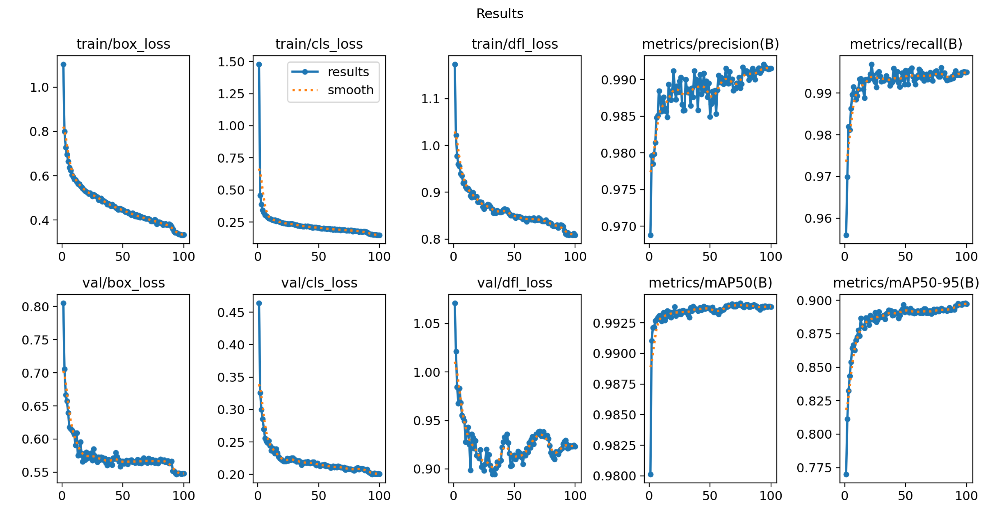

In [ ]:
image = mpimg.imread(f"/content/runs/detect/train/results.png")
plt.figure(figsize=(16, 9), dpi=300)
plt.title('Results')
plt.imshow(image)
plt.axis('off')
plt.show()

In [ ]:
csv_file_path = f"/content/runs/detect/train/results.csv"
df = pd.read_csv(csv_file_path)
df

,epoch,train/box_loss,train/cls_loss,train/dfl_loss,metrics/precision(B),metrics/recall(B),metrics/mAP50(B),metrics/mAP50-95(B),val/box_loss,val/cls_loss,val/dfl_loss,lr/pg0,lr/pg1,lr/pg2
0,1,1.10380,1.47990,1.17380,0.96878,0.95593,0.98014,0.77010,0.80518,0.46401,1.07110,0.067243,0.000331,0.000331
1,2,0.79930,0.45907,1.02230,0.97964,0.96991,0.99105,0.81143,0.70589,0.32549,1.02140,0.034236,0.000658,0.000658
2,3,0.72781,0.38633,0.97696,0.97850,0.98203,0.99209,0.83257,0.66695,0.29974,0.98429,0.001223,0.000978,0.000978
3,4,0.69559,0.34358,0.95979,0.97985,0.98116,0.99213,0.84334,0.65717,0.28544,0.96750,0.000970,0.000970,0.000970
4,5,0.66529,0.32439,0.95529,0.98144,0.98632,0.99266,0.85398,0.63958,0.26989,0.98322,0.000960,0.000960,0.000960
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
95,96,0.33605,0.15096,0.81043,0.99152,0.99497,0.99383,0.89654,0.54838,0.20184,0.92404,0.000060,0.000060,0.000060
96,97,0.33557,0.15048,0.80966,0.99152,0.99502,0.99382,0.89773,0.54787,0.20063,0.92326,0.000050,0.000050,0.000050
97,98,0.33202,0.14952,0.80829,0.99145,0.99514,0.99386,0.89752,0.54744,0.20080,0.92340,0.000040,0.000040,0.000040
98,99,0.33180,0.14759,0.81212,0.99152,0.99494,0.99386,0.89788,0.54806,0.20150,0.92432,0.000030,0.000030,0.000030


### **2.5. Plot Labels and Predicted Results**

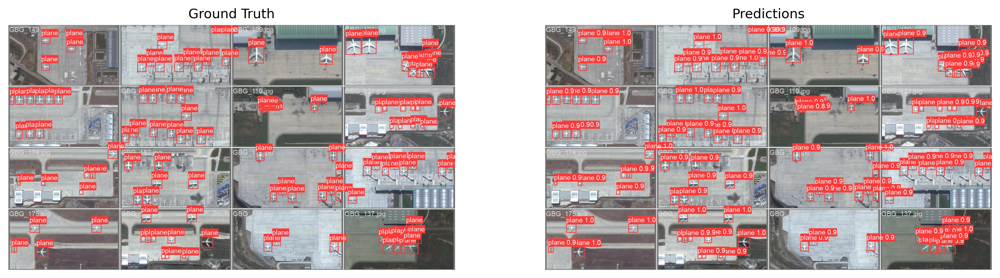

In [ ]:
image1 = mpimg.imread(f"/content/runs/detect/val/val_batch0_labels.jpg")
image2 = mpimg.imread(f"/content/runs/detect/val/val_batch0_pred.jpg")

fig, axes = plt.subplots(1, 2, figsize=(16, 9), dpi=300)
axes[0].imshow(image1)
axes[0].set_title('Ground Truth')
axes[0].axis('off')
axes[1].imshow(image2)
axes[1].set_title('Predictions')
axes[1].axis('off')
plt.savefig(f"{BASE_DIRECTORY}/outputs/label_pred.png")
plt.show()

## **3. Move Model Items into Google Drive**

Instead of uploading and downloading files, we can directly move them to the desired path.

In [ ]:
shutil.move("/content/runs/detect/", BASE_DIRECTORY)

'/gdrive/MyDrive/Datasets/HRPlanes/YOLOV8/YOLOv8x/Experiment_No_12/detect'

In [ ]:
from datetime import datetime
print(f"Changes have been made to the project on {datetime.now().strftime('%Y-%m-%d %H:%M:%S')}")

Changes have been made to the project on 2024-04-29 15:24:15
Changes have been made to the project on 2024-04-29 15:24:15
